## Modelling Antibiotic Resistance in Urinary Tract Infections in the UK

This document describes a brief modelling project to see whether current models can capture observed changes in trimethoprim resistance in urinary cultures in the UK. The model looks at transmission and within-host dynamics of uropathogenic _E. coli_ in the gut microbiome.

In [1]:
using DifferentialEquations, Plots, Optim, LineSearches, Distributions, GaussianProcesses, StatsBase, CSV, DataFrames, IJulia

## Model

The model is based on the within-host competition model without differential within-host growth described in Davies et al, 2019. A flow diagram and model equations can be found in flowdiag.pdf.

In [3]:
#Model code
function tc(du, u, p, t)

    β, μ, k, c, τ, propUTI, proptreat, proptrim = p
    S, R, Sr, Rs = u
    X = 1 - (S + R + Sr + Rs)
    
    Stot = S + Sr 
    Rtot = R + Rs 

    λS = β*Stot
    λR = (1-c)*β*Rtot

    τtT = propUTI*proptreat*proptrim*τ
    τtN = propUTI*proptreat*(1-proptrim)*τ

    du[1] = λS*X - k*λR*S - μ*S - (τtT+τtN)*S 
    du[2] = λR*X - k*λS*R - μ*R - τtN*R + τtT*(Sr+Rs) 
    du[3] = k*λR*S - μ*Sr - (τtT+τtN)*(Sr+Rs)
    du[4] = k*λS*R - μ*Rs - (τtT+τtN)*(Sr+Rs)

end


tc (generic function with 1 method)

## Parameters

All units for parameters are in days. Parameters for the transmission rate (β) and resistance cost (c) are be fitted below. I assume that there is no barrier to acquisition of a second colonisation (k = 1). For natural clearance, there are no estimates that I am aware of for the duration of uropathogenic _E. coli_ colonisation in the gut, so I assume a duration of 3 months (μ = 1/(30*3)). Duration of UTI symptoms after treatment is 5 days (Butler et al, 2007) - but I assume that it takes 10 days for the bacteria to be fully cleared (i.e. symptoms subside but the bacteria may still be present in the gut) (τ = 1/10). The proportion of individuals that are prescribed antibiotics if they have UTI symptoms is 0.63 (Cooper et al, 2023). 

To estimate the proportion of those who receive treatment that get trimethoprim, I used primary care prescription data from Waterlow, Ashfield and Knight, 2024. I estimated this as trimethoprim/(nitrofurantoin + trimethoprim) prescriptions per capita at each time point in the data, as these antibiotics are used almost exclusively for UTIs. At the start of the data in 2015, this was 0.60.

To estimate the proportion of individuals that develop a UTI if they have gut colonisation, I estimated this by dividing the prevalence of UTIs by the prevalence of uropathogenic _E. coli_ in the gut that I am targetting. To get the prevalence of UTIs, I found the incidence of UTI symptoms per capita over one year (0.26, Cooper et al, 2023) and the duration of UTI symptoms in the absence of treatment (9 days, Hoffman et al). The prevalence was then estimated as 0.26 * 9/365 = 0.00641. And the proportion that get UTIs as 0.00641/0.36 = 0.0178.

In [4]:
k = 1
μ = 1/(30*3)
τ = 1/5
proptreat = 0.63
propUTI = 0.0178
proptrim = 0.6009109694608054

0.6009109694608054

## Model fitting

For target values, I chose the following:
- Target prevalence of uropathogens in the gut microbiome: 36% (Moreno et al, 2009). This study looked at _E. coli_ in the microbiome of 39 healthy women. They found that the clone B2 was strongly linked to UTI symptoms and was present in 36% of their samples. All samples contained some _E. coli_.
- Target frequency of resistance to trimethoprim: 33.6% (Office for Health Improvement and Disparities, 2025) This is the trimethoprim resistance rate of _E. coli_ from urine samples taken for UTI diagnosis at the start of the data series, in 2015.

Here, I find transmission rate (β) and resistance cost (c) parameters that achieves the target prevalence and resistance frequency. To show the uncertainty associated with one of the parameters, I vary the proportion of people with a uropathogen in their gut who develop a UTI (`propUTI`). This requires finding a transmission rate and resistance cost for every value of `propUTI` tested. 

In [5]:
#Some fitting functions for the model
include("fittingfunctions.jl")

#Targets
prevtarg = 0.36
restarg = 0.336

#Vector of parameters, with placeholders for β and c
p = [1., μ, k, 1., τ, propUTI, proptreat, proptrim]

#Need a good starting point for the optimiser to work. Based on testing different values by hand:
getmetrics(exp.([1/47, 0.119]))

2-element Vector{Float64}:
 0.35518553833080885
 0.3458000982351832

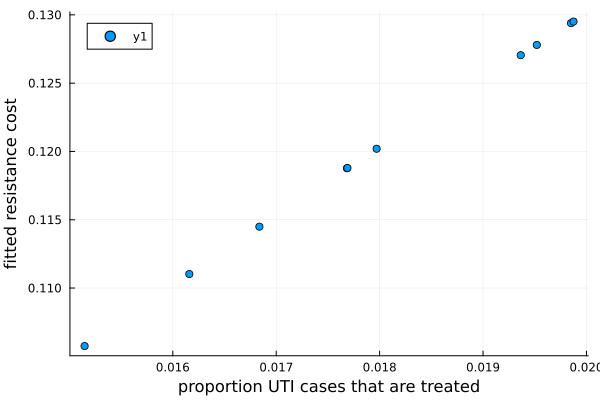

In [9]:
initial_x = exp.([1/47, 0.119])
lower = exp.([0., 0.])
upper = exp.([1., 1.])

#Generating different propUTI values
testvals = exp.(rand(Distributions.Normal(log(propUTI), .1), 10))

#Generate best transmission rate and resistance cost for each propUTI value
transmissionrate = zeros(length(testvals))
resistancecost = zeros(length(testvals))
obtainedprev = zeros(length(testvals))
obtainedrfreq = zeros(length(testvals))

for i in eachindex(testvals)
    p[6] = testvals[i]
    paramresults = optimize(getdist, lower, upper, initial_x, 
        Fminbox(BFGS()), Optim.Options(g_tol = 1e-12))
    transmissionrate[i] = deepcopy(paramresults.minimizer[1])
    resistancecost[i] = deepcopy(paramresults.minimizer[2])
    obtainedprev[i] = getmetrics(paramresults.minimizer)[1]
    obtainedrfreq[i] = getmetrics(paramresults.minimizer)[2]
end

scatter(testvals, log.(resistancecost), 
    xlab = "proportion UTI cases that are treated", ylab = "fitted resistance cost")

In [8]:
obtainedrfreq

10-element Vector{Float64}:
 0.3359999446607519
 0.33599993815180096
 0.335999935224544
 1.2115352079918689e-16
 0.3359998786090544
 0.3359999536173926
 0.3359999151303965
 0.3359999422085495
 0.3359999429973843
 0.3359999445776455

## Varying treatment rates

Next, I varied treatment rates according to primary care prescription data from NHS England, obtained through a Freedom of Information Request and described in Waterlow, Ashfield and Knight, 2024. Here, I vary the `proptrim` parameter according to the proportion of prescriptions that were trimethoprim (calculated in prescriptionanalysis.R), interpolating between time points using a gaussian process model. 

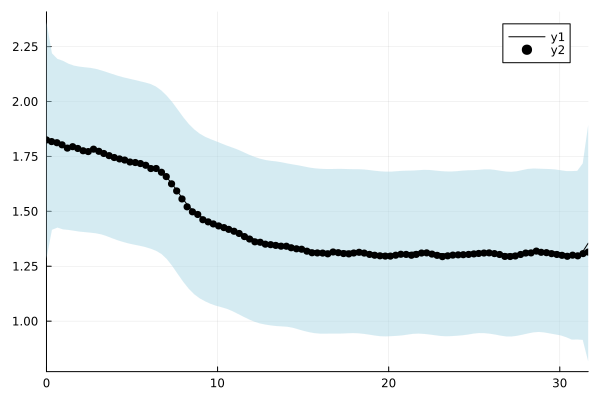

In [10]:
#Import the data 
relpresdata = CSV.File("relativeprescriptionchanges.csv") 
time = [float(relpresdata[i][1]) for i in 1:length(relpresdata)]
relpres = [relpresdata[i][2] for i in 1:length(relpresdata)]

#Function to have a time-varying treatment rate using a gaussian process function
mZero = MeanConst(exp(relpres[1]))
kern = SE(.0,.0)
logObsNoise = -1. 

gp = GP(time/100, exp.(relpres), mZero, kern, logObsNoise)
plot(gp) #show the model

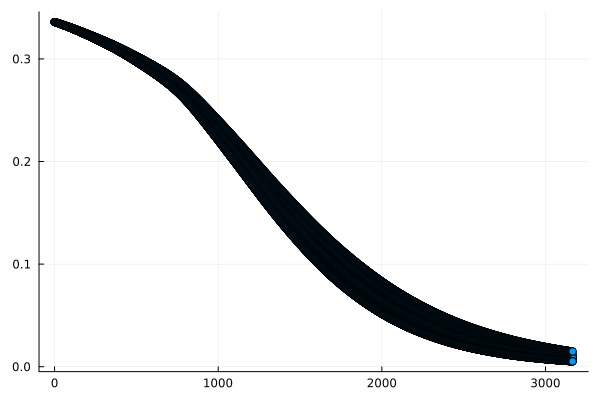

In [13]:

getrelpres(t) = log.(GaussianProcesses.predict_y(gp, [t/100])[1])

#Alternative version of the model that uses the time-varying propT function
function tctauvary(du, u, p, t)

    β, μ, k, c, τ, propUTI, proptreat = p
    proptrim = getrelpres(t)[1]
    S, R, Sr, Rs = u
    X = 1 - (S + R + Sr + Rs)

    Stot = S + Sr 
    Rtot = R + Rs 

    λS = β*Stot
    λR = (1-c)*β*Rtot

    τtT = propUTI*proptreat*proptrim*τ
    τtN = propUTI*proptreat*(1-proptrim)*τ

    du[1] = λS*X - k*λR*S - μ*S - (τtT+τtN)*S 
    du[2] = λR*X - k*λS*R - μ*R - τtN*R + τtT*(Sr+Rs) 
    du[3] = k*λR*S - μ*Sr - (τtT+τtN)*(Sr+Rs)
    du[4] = k*λS*R - μ*Rs - (τtT+τtN)*(Sr+Rs)

end

#And a function to get resistance frequency
function getresfreq(u)
    if sum(u) > 0.
        sum(u[[2,4]])/sum(u)
    else
        0
    end
end

#Loop through each test value
p = [1., μ, k, 1., τ, propUTI, proptreat, proptrim]
p2 = [1., μ, k, 1., τ, propUTI, proptreat]

rfreqpredict = Float64[]

for i in eachindex(testvals)

    u0 = [0.1,0.1,0.,0.]
    tspan = (0.,5000.)
    p[1] = log(transmissionrate[i])
    p[4] = log(resistancecost[i])
    p[6] = testvals[i]
    probstart = ODEProblem(tc, u0, tspan, p, dtmax = 1.)
    solstart = solve(probstart)

    u0 = solstart(5000.)
    tspan = (0.,3166.)
    p2[1] = log(transmissionrate[i])
    p2[4] = log(resistancecost[i])
    p2[6] = testvals[i]
    prob2 = ODEProblem(tctauvary, u0, tspan, p2, dtmax = 1.)
    sol = solve(prob2)
    append!(rfreqpredict, [getresfreq(sol(t)) for t in 0:3166])
end

#Write to CSV; make main plot using fingertipsanalysis.R
df = DataFrame(rfreq = rfreqpredict, 
    timeindays = repeat([0:1:3166;], outer = length(testvals)),
    proputi = repeat(testvals, inner = 3167))
CSV.write("modeloutput.csv", df)

#Idea of results
scatter(repeat([0:1:3166;], 
    outer = length(testvals)), rfreqpredict,labels = false)

## References
- Butler. 2007. ‘Containing Antibiotic Resistance: Decreased Antibiotic-Resistant Coliform Urinary Tract Infections with Reduction in Antibiotic Prescribing by General Practices’. British Journal of General Practice.
- Cooper, Emily, Brieze Read, Leigh Sanyaolu, Haroon Ahmed, and Donna Lecky. 2023. ‘Impact of Sociodemographic Status and UTI Symptoms on Women’s Health-Care Seeking and Management in England: Findings from an e-Survey Conducted during the First Year of the COVID-19 Pandemic’. BJGP Open 7 (4): BJGPO.2023.0039. https://doi.org/10.3399/BJGPO.2023.0039.
- Davies, Nicholas G., Stefan Flasche, Mark Jit, and Katherine E. Atkins. 2019. ‘Within-Host Dynamics Shape Antibiotic Resistance in Commensal Bacteria’. Nature Ecology & Evolution 3 (3): 440–49. https://doi.org/10.1038/s41559-018-0786-x.
- Hoffmann, Tammy, Ruwani Peiris, Chris Del Mar, Gina Cleo, and Paul Glasziou. 2020. ‘Natural History of Uncomplicated Urinary Tract Infection without Antibiotics: A Systematic Review’. British Journal of General Practice 70 (699): e714–22. https://doi.org/10.3399/bjgp20X712781.
- Moreno, Eva, James R Johnson, Teresa PErez, Guillem Prats, Michael A Kuskowski, and Antonia Andreu. 2009. ‘Structure and Urovirulence Characteristics of the Fecal Escherichia Coli Population among Healthy Women’. Microbes and Infection.
- Office for Health Improvement and Disparities. 2025. ‘Indicator: Percentage of Community E. Coli (or Coliform) Urine Specimens Resistant to Trimethoprim; by Quarter. Public Health Profiles.’ 2025. https://fingertips.phe.org.uk/.
- Waterlow, Naomi R, Tom Ashfield, and Gwenan M Knight. 2024. ‘Observational Study of Antibiotic Prescribing Patterns by Age and Sex in Primary Care in England: Why We Need to Take This Variation into Account to Evaluate Antibiotic Stewardship and Predict AMR Variation’. JAC-Antimicrobial Resistance 7 (1): dlae210. https://doi.org/10.1093/jacamr/dlae210.

